# Modeling complex data densities using the EM algorithm

##### Authored by [Tal Rave](https://www.linkedin.com/in/tal-rave-59833715a)

In this project I will implement the EM (Expectation Maximization) algorithms that are used to learn the parameters of the models described in chapter 7 of Simon J.D. Prince's book [[1](http://www.computervisionmodels.com/)] - these include the Mixture of Gaussians, Multivariate Student's t-distribution, Factor Analysis, and finally the combined Mixture of Robust Subspace Models.

In [1]:
import numpy as np
from numpy import newaxis as x
from numpy import log
from numpy.linalg import inv, det
import matplotlib.pyplot as plt
from scipy.stats import multivariate_normal as norm
from scipy.stats import multivariate_t as stud
from scipy.special import gammaln, digamma
from sklearn import datasets
import cv2
from sklearn.cluster import KMeans
from scipy.stats import mode
from sklearn.metrics import accuracy_score
import seaborn as sns;
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import confusion_matrix

dpi = 100
eps = 1e-32

faces = datasets.fetch_olivetti_faces()

# multiplies a series of matrices
def mm(*mats):
    m = np.matmul(mats[0], mats[1])
    for mat in mats[2:]:
        m = np.matmul(m, mat)
    return m

# plots the Log Likelihood of the EM epochs
def plotObjective(L):
    plt.figure(dpi=dpi)
    plt.axes().xaxis.set_major_locator(plt.MaxNLocator(integer=True))
    plt.title('Objective')
    plt.xlabel('Epoch')
    plt.ylabel('Log Likelihood')
    plt.plot(L)
    plt.show()

## MoG (Mixture of Gaussians) 

Let's define a MoG sampling method (see [[2](http://web4.cs.ucl.ac.uk/staff/s.prince/book/book.pdf)])...

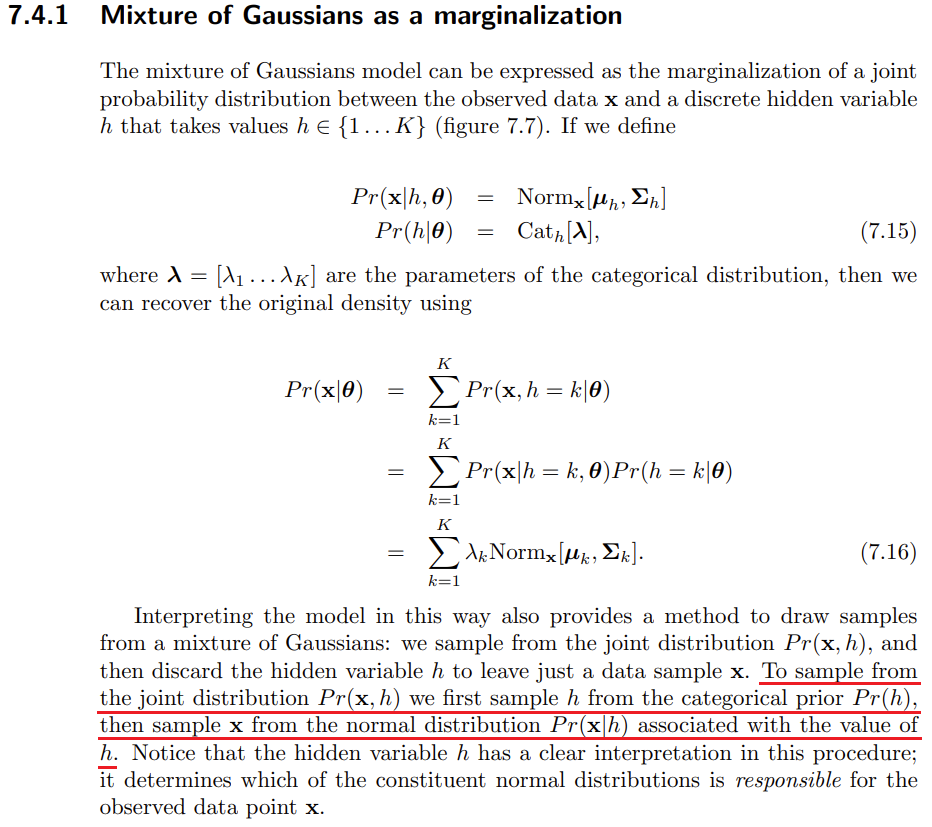

In [2]:
# returns n samples from the received MoG distribution and displays an appropriate scatter plot
def sample_and_display_MoG(coefs, means, covas, n=1000):
    sampleCat = np.random.multinomial(n, coefs)
    X = np.concatenate([np.random.multivariate_normal(means[i], covas[i], k) 
                        for i, k in enumerate(sampleCat)], axis=0)
    plt.figure(dpi=dpi)
    plt.axis('equal')
    plt.scatter(x=X[:,0], y=X[:,1], alpha=0.1)
    plt.show()
    return X

Now, let's implement an appropriate EM algorithm (see [[3](http://www0.cs.ucl.ac.uk/external/s.prince/book/Algorithms.pdf)])...

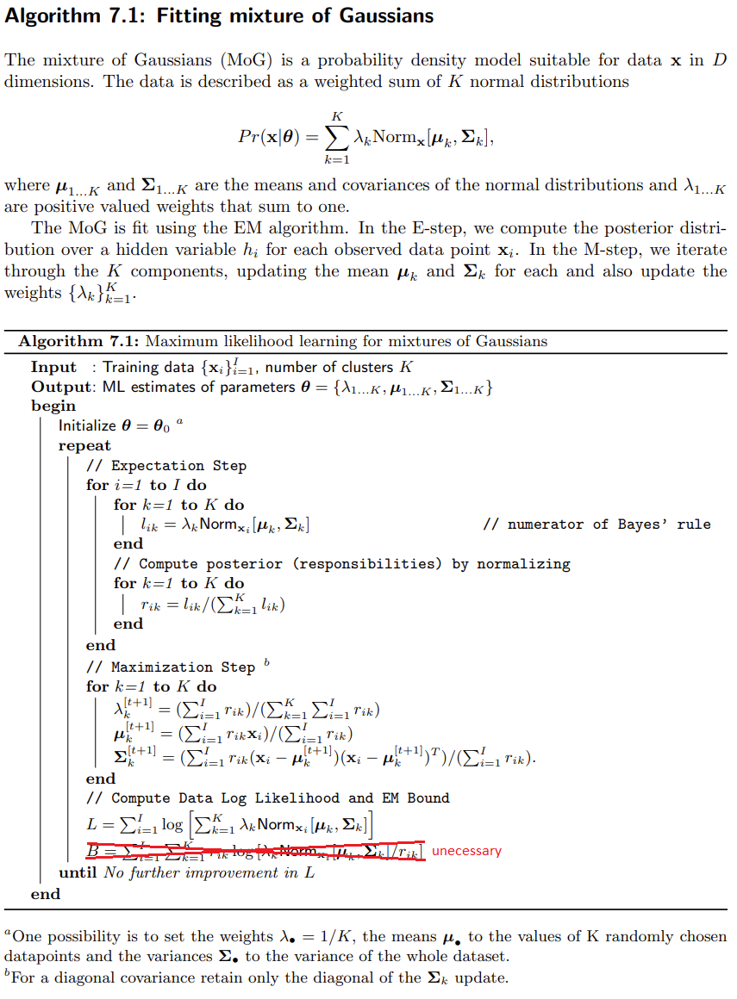

In [3]:
# X = data points, K = number of mixture components, delta = convergence criterion
def EM_MoG(X, K=1, delta=1.0, epochs=100, disp=False):
    
    # init distribution coefficients to 1/K
    c = np.full(K, 1/K) 
    # init means by randomly choosing K data points
    u = X[np.random.choice(len(X), K)]  
    # init all covariance matrices to the covariance matrix of the data
    Z = np.repeat(np.cov(X.T)[x], K, axis=0)
    L = [-np.inf]
    
    while True:
        
        # visualize
        if disp:
            sample_and_display_MoG(c, u, Z)
        
        # objective:
        r = np.stack([c[k] * norm.pdf(X, u[k], Z[k]) for k in range(K)], axis=1)
        L.append(np.sum(log(np.sum(r, axis=1))))
        if not epochs or L[-1] - L[-2] < delta:
            if disp:
                plotObjective(L[1:])
            return c, u, Z
        epochs -= 1
        
        # E step:
        r /= np.sum(r, axis=1, keepdims=True)
        
        # M step:
        c = np.sum(r, axis=0) / np.sum(r)
        u = np.sum(r[:,:,x] * X[:,x], axis=0) / np.sum(r, axis=0)[:,x]
        Z = (np.sum(r[:,:,x,x] * mm(
            (X[:,x] - u[x])[...,x], (X[:,x] - u[x])[...,x,:]), axis=0) / np.sum(r[:,:,x,x], axis=0))

Let's sample a 2D MoG distribution and display a scatter plot...

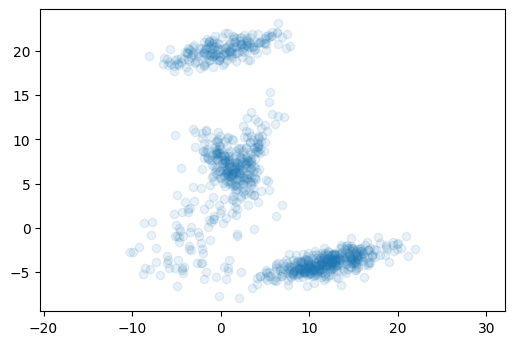

In [4]:
coefs = [0.1, 
         0.1, 
         0.2,
         0.2,
         0.4]

means = [[-3, -1],
         [3,8], 
         [0,20],
         [1,7],
         [12,-4]]

covas = [[[10,0],
          [0,10]],
         [[2,3],
          [3,9]],
         [[10,2],
          [2,1]],
         [[3,-2],
          [-2,3]],
         [[10,2],
          [2,1]]]

X = sample_and_display_MoG(coefs, means, covas)

Now, call EM_MoG on the samples and illustrate the convergence (compare the result to the above's)...

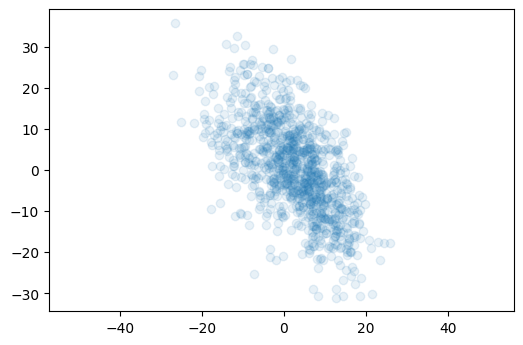

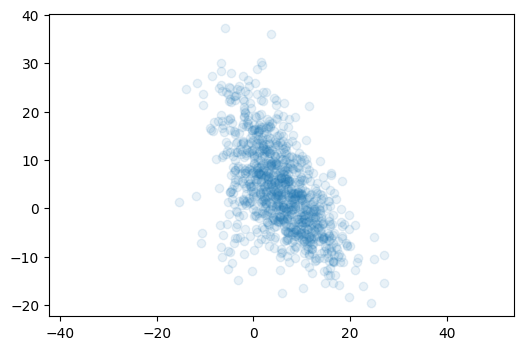

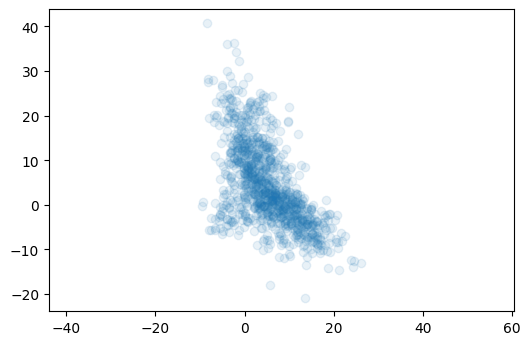

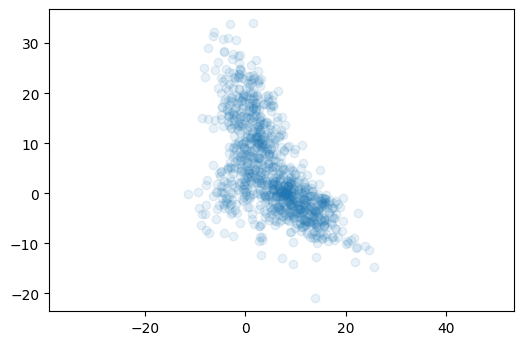

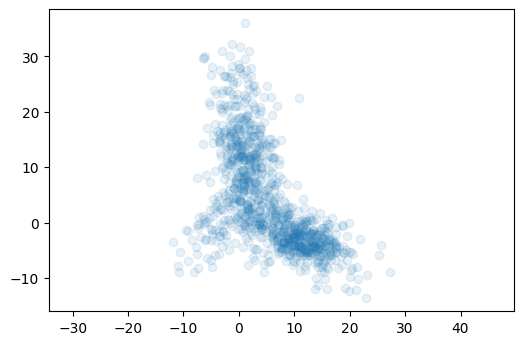

...

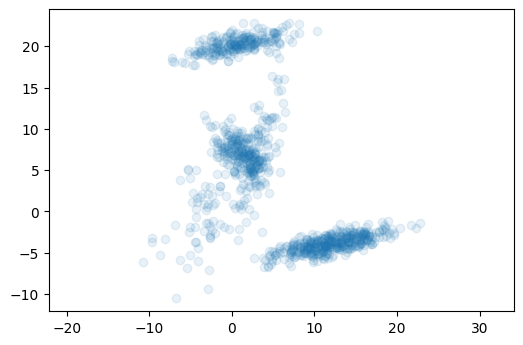

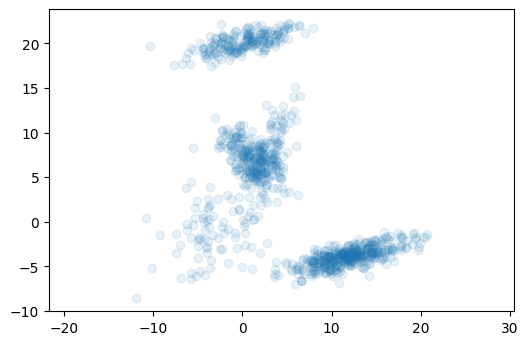

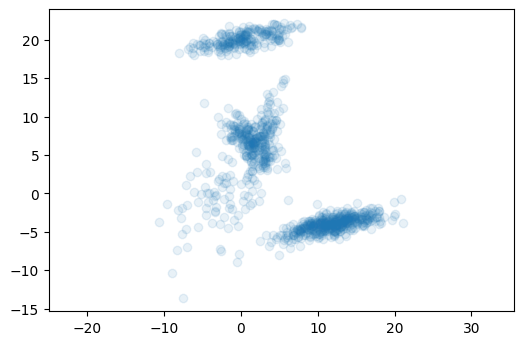

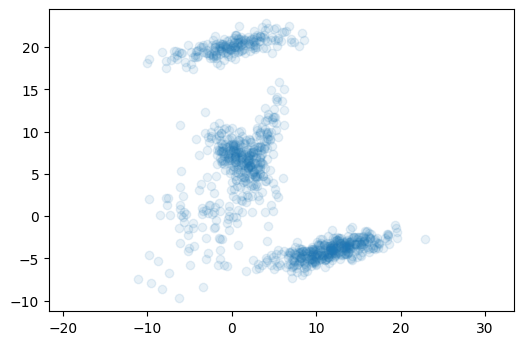

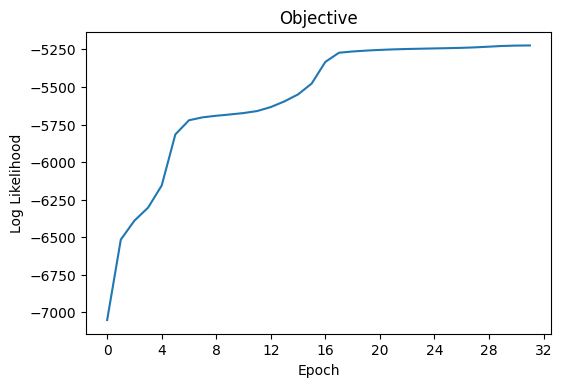

In [5]:
EM_MoG(X, K=5, disp=True);

We can clearly see that the MoG model was able to fit the data very well.

## MSt (Multivariate Student's t-distribution)

Let's define an MSt sampling method (see [[4](https://en.wikipedia.org/wiki/Multivariate_t-distribution)])...

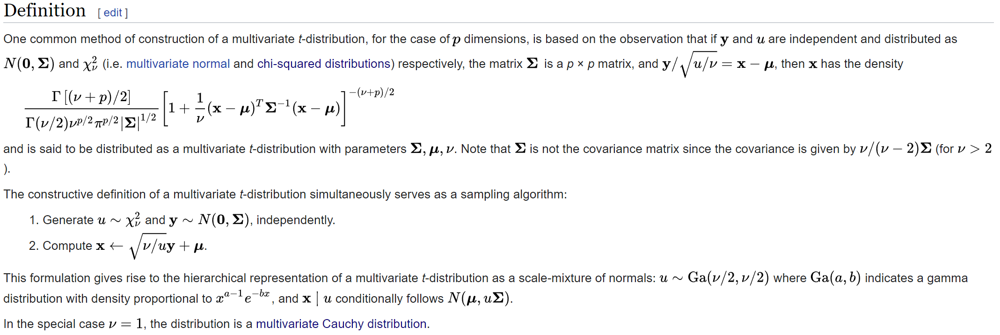

In [6]:
# returns n samples of the received MSt distribution and displays an appropriate scatter plot
def sample_and_display_MSt(mean, cova, v, n=1000):
    mean = np.array(mean)  
    X = (np.sqrt(v / np.random.chisquare(v, n))[:,x] * 
         np.random.multivariate_normal(np.zeros(mean.shape), cova, n) + 
         mean)
    plt.figure(dpi=dpi) 
    plt.axis('equal')
    plt.scatter(X[:,0], X[:,1], alpha=0.5)
    plt.show()
    return X

Implement EM (see [[3](http://www0.cs.ucl.ac.uk/external/s.prince/book/Algorithms.pdf)])...

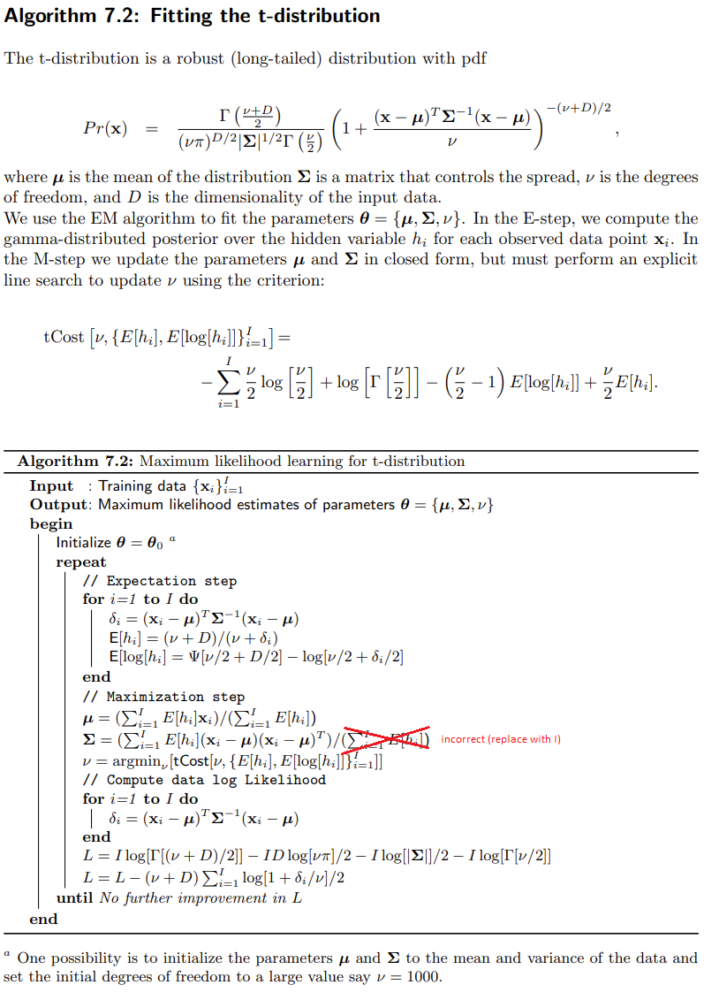

In [7]:
# V = values of v to check
def EM_MSt(X, V=np.linspace(1,1000,100)[:,x], delta=10.0, epochs=100, disp=False):
    n, D = X.shape
    u = np.mean(X, axis=0)
    Z = np.cov(X.T)
    v = np.max(V)
    L = [-np.inf]
    
    while True:
        
        # visualize
        if disp:
            sample_and_display_MSt(u, Z, v)
            print(f"v: {v}")
        
        # objective
        L.append(np.sum(stud.logpdf(X, u, Z, v)))
        d = mm((X - u[x])[...,x].transpose([0,2,1]), inv(Z)[x], (X - u[x])[...,x]).reshape(n)
        if epochs == 0 or L[-1] - L[-2]  < delta:
            if disp:
                plotObjective(L[1:])
            return u, Z, v
        epochs -= 1
        
        # E step:
        Eh = (v + D) / (v + d)
        Elogh = digamma((v + D) / 2) - log((v + d) / 2)
        
        # M step:
        u = np.sum(X * Eh[:,x], axis=0) / np.sum(Eh)
        Z = np.mean(Eh[:,x,x] * mm((X - u[x])[...,x], (X - u[x])[...,x].transpose([0,2,1])), axis=0)
        v = V[np.argmax(np.sum(
            V / 2 * log(V / 2) - gammaln(V / 2) + (V / 2 - 1) * Elogh - V / 2 * Eh, axis=1), axis=0), 0]

Sample a 2D MSt distribution and display a scatter plot (v is set to a low value to simulate outliers)...

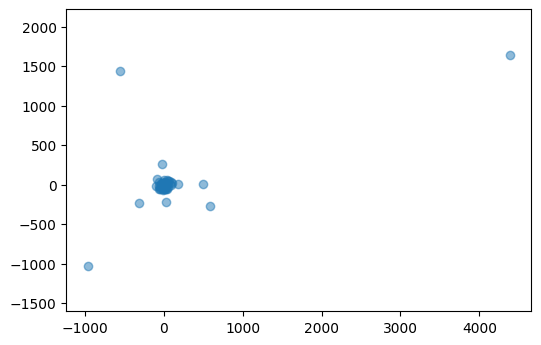

In [36]:
mean = [0,0]

cova = [[1,0],
        [0,1]]

v = 1.0

X = sample_and_display_MSt(mean, cova, v)

Call EM_MSt on the samples and illustrate the convergence and robustness to outliers...

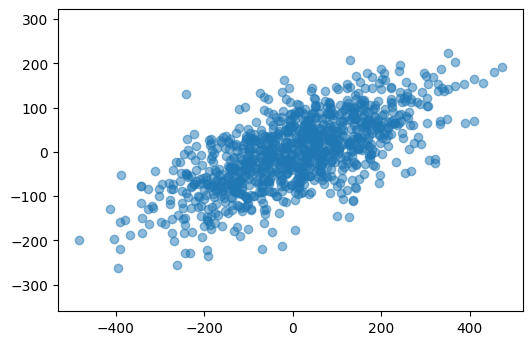

v: 1000.0


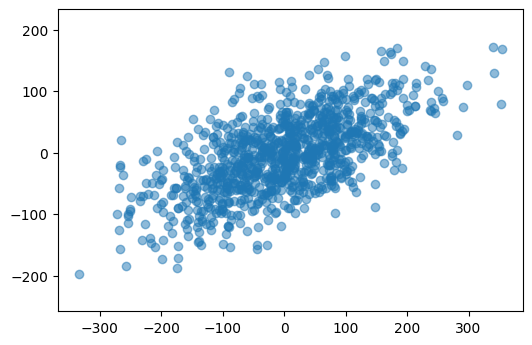

v: 757.8181818181819


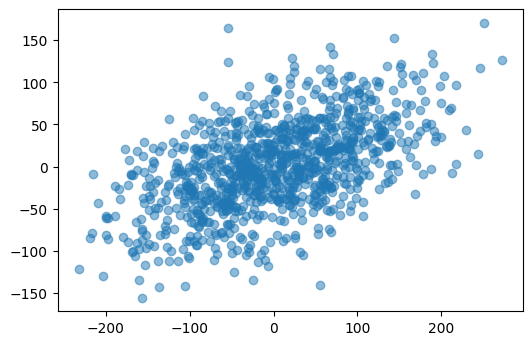

v: 465.18181818181824


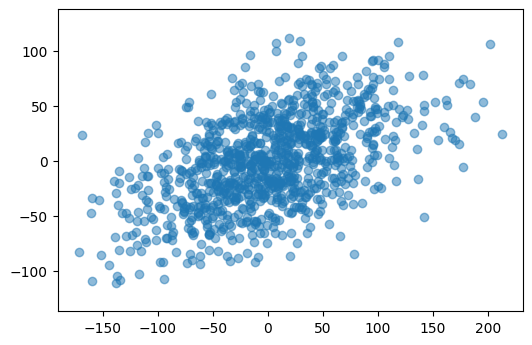

v: 253.27272727272728


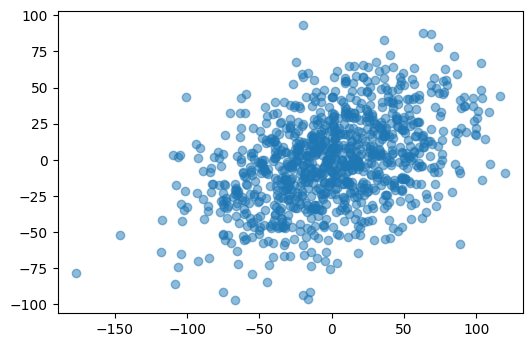

v: 122.0909090909091


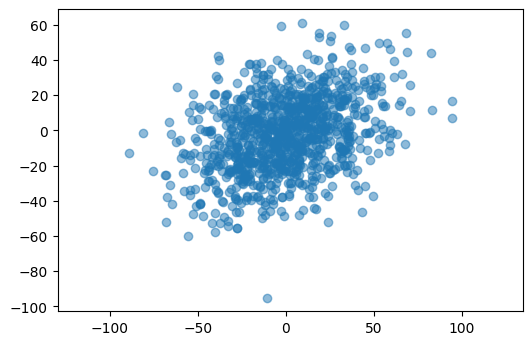

v: 61.54545454545455


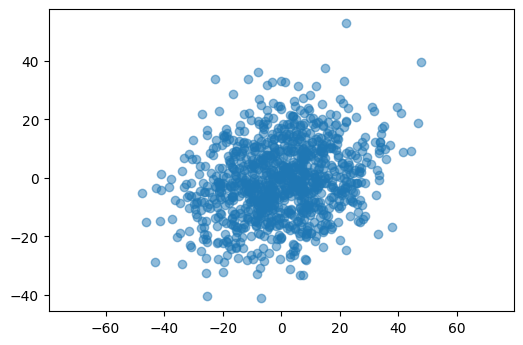

v: 31.272727272727273


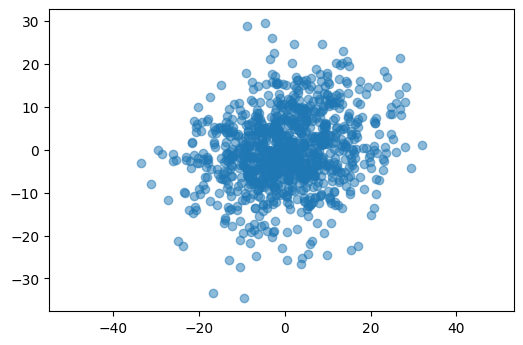

v: 21.181818181818183


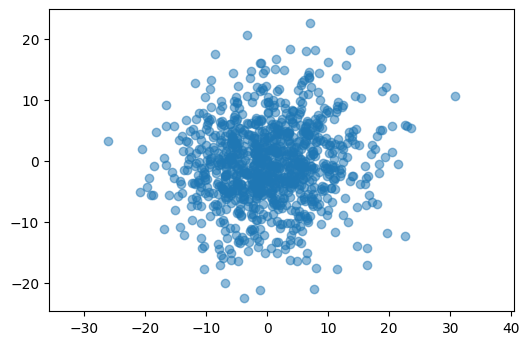

v: 11.090909090909092


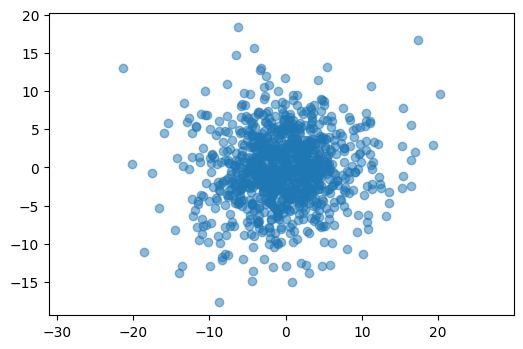

v: 11.090909090909092


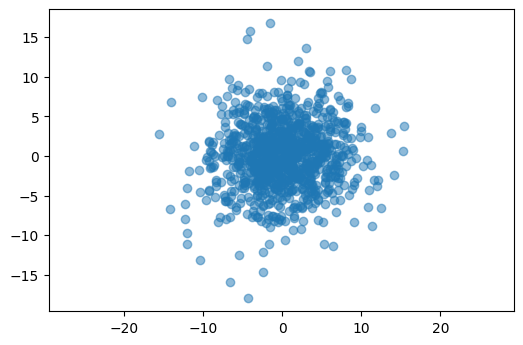

v: 11.090909090909092


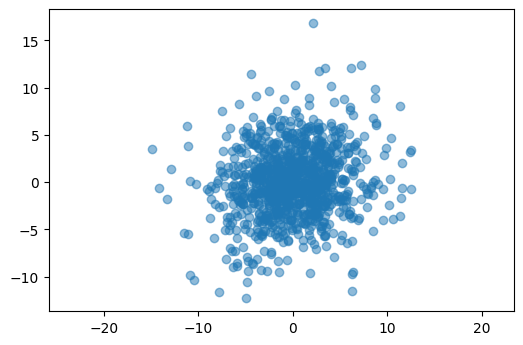

v: 11.090909090909092


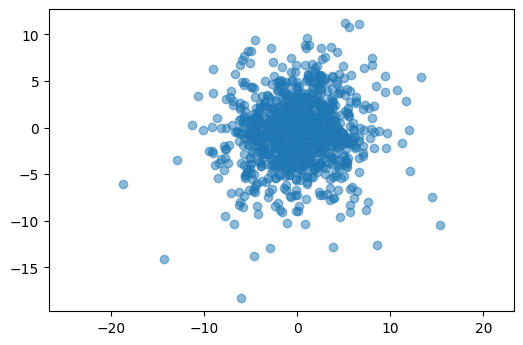

v: 11.090909090909092


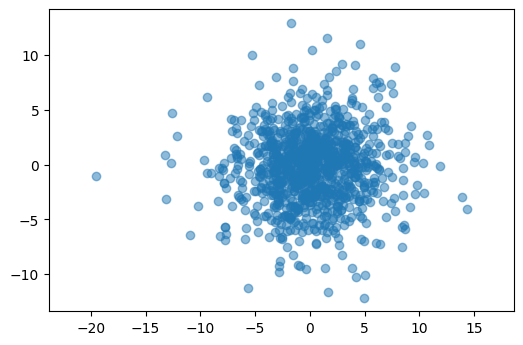

v: 11.090909090909092


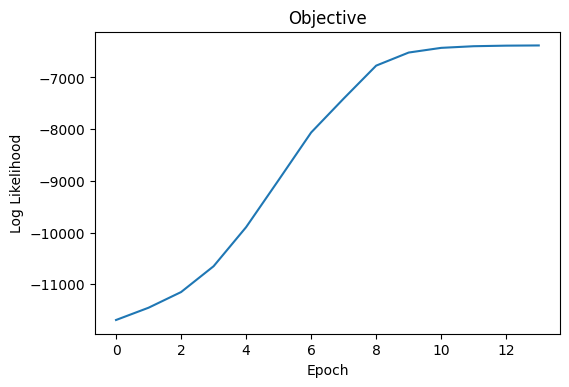

In [37]:
EM_MSt(X, disp=True);

Call MoG_EM to illustrate the lack of robustness of the MoG model (compare the result to the above's)...

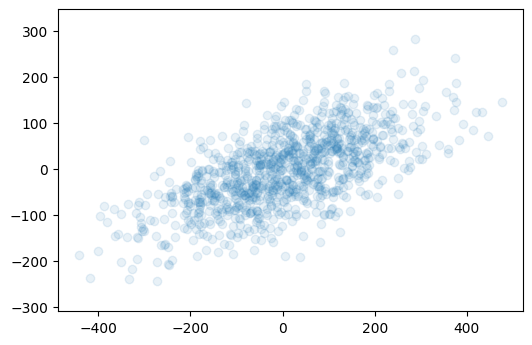

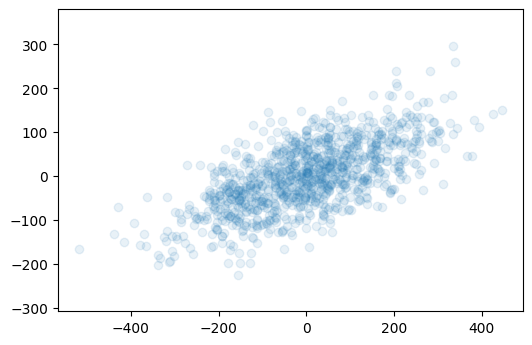

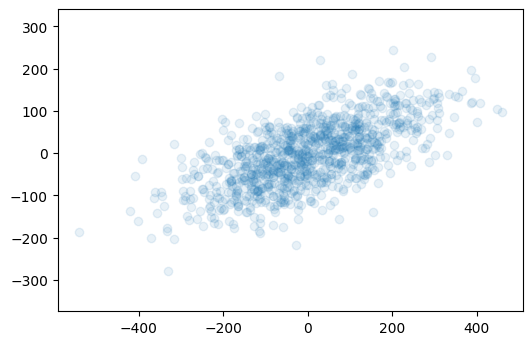

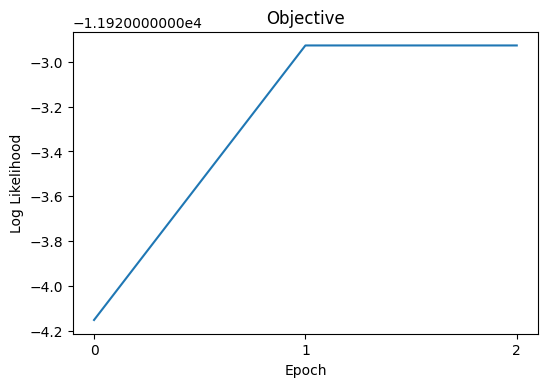

In [47]:
EM_MoG(X, disp=True);

We can clearly see how the MoG model was severely affected by the obvious outliers.

## FA (Factor Analysis)

Implement EM (see [[3](http://www0.cs.ucl.ac.uk/external/s.prince/book/Algorithms.pdf)])...

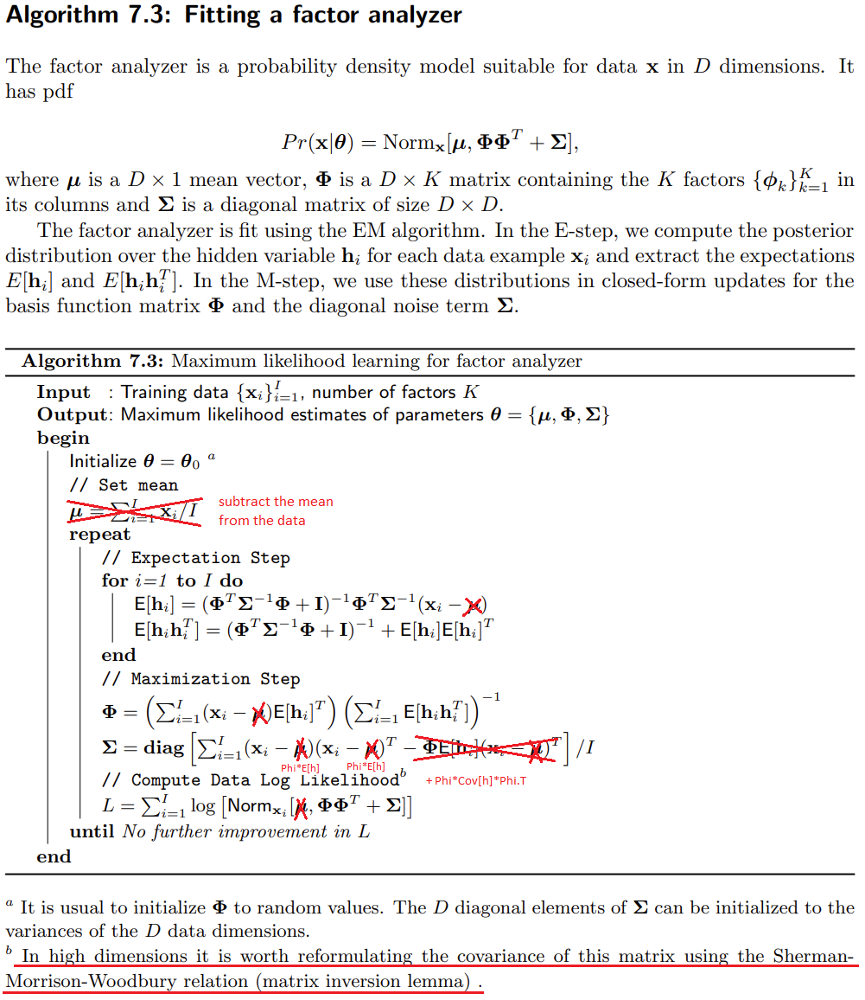

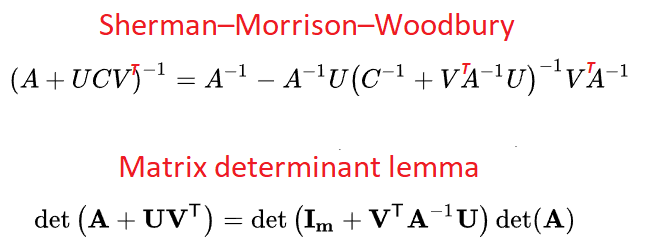

In the above expressions A is the diagonal covariance matrix, U=V is the factor matrix, and C=Im. 
Also note that since A is diagonal (its inverse is 1/A), I use the Hadamard product/division [[9](https://en.wikipedia.org/wiki/Hadamard_product_(matrices))] instead of matrix multiplication wherever possible.

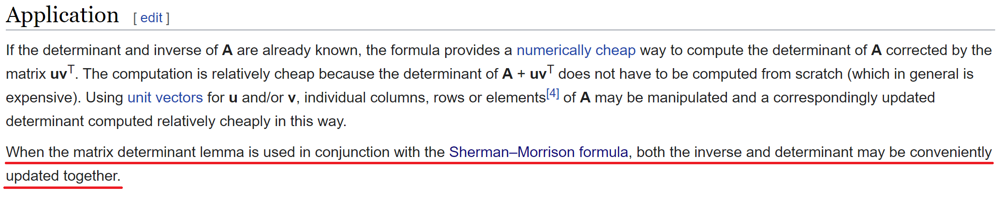

See [[6](https://en.wikipedia.org/wiki/Woodbury_matrix_identity)] and [[7](https://en.wikipedia.org/wiki/Matrix_determinant_lemma)] for more details about the Sherman-Morrison-Woodbury relation and the matrix determinant lemma, respectively.

In [39]:
# K = the number of factors
def EM_FA(X, K=1, delta=1e+4, epochs=10, disp=False):
    n, D = X.shape
    # subtract the mean from the data
    u = np.mean(X, axis=0)
    X = X - u
    # init variances
    Z = np.var(X, axis=0)
    # init Phi to random numbers
    P = np.random.normal(size=(D,K))
    I = np.identity(K)
    L = [-np.inf]
    
    while True:
        
        # incorporate the determinant lemma and the Sherman-Morrison-Woodbury relation
        Ch = inv(mm(P.T / Z, P) + I)
        logDet = np.sum(log(Z)) - np.linalg.slogdet(Ch)[1]
        SMW = (-D*log(2*np.pi) - logDet - np.sum(X**2 / Z, axis=-1) +
               mm(X[...,x].transpose([0,2,1]) / Z, P, Ch, P.T / Z, X[...,x]).reshape([n]))/2
        
        # objective:
        L.append(np.sum(SMW))
        if not epochs or L[-1] - L[-2]  < delta:
            if disp:
                plotObjective(L[1:])
            return u, Z, P
        epochs -= 1
        
        # E step:
        Eh = mm(Ch[x], (P.T / Z)[x], X[...,x])
        EhhT = Ch[x] + mm(Eh, Eh.transpose([0,2,1]))
        
        # M step:
        P = mm(np.sum(mm(X[...,x], Eh.transpose([0,2,1])), axis=0), inv(np.sum(EhhT, axis=0)))
        Z = np.mean((X[...,x] - mm(P[x], Eh))**2 + np.sum(mm(P, Ch) * P, axis=1)[...,x], axis=(0,2))

Call EM_FA on the Olivetti faces dataset [[5](https://scikit-learn.org/0.19/datasets/olivetti_faces.html)] and illustrate the convergence...

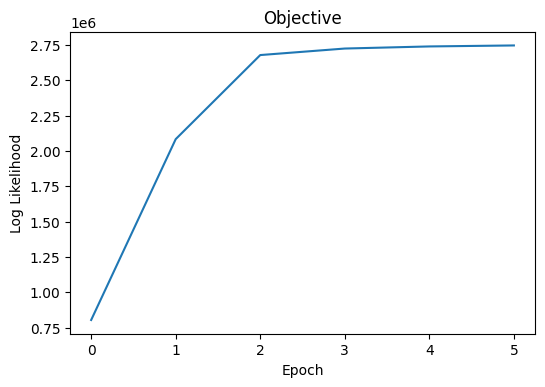

In [12]:
imgs = faces.images
X = imgs.reshape(400,-1)
K = 64
u, Z, P = EM_FA(X, K=K, disp=True)

Visualize the mean and the diagonal covariance matrix...

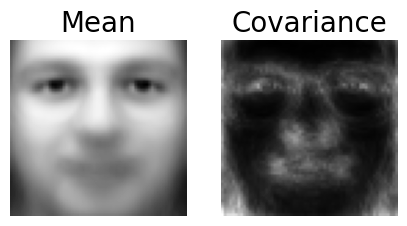

In [13]:
t = np.reshape(np.concatenate([u[x], Z[x], P.T], axis=0), (-1,64,64))

plt.figure(figsize=(5,5), dpi=dpi)

plt.subplot(1,2,1)
plt.axis('off')
plt.title('Mean', size=20)
plt.imshow(t[0], cmap='gray');

plt.subplot(1,2,2)
plt.axis('off')
plt.title('Covariance', size=20)
plt.imshow(t[1], cmap='gray');

It's interesting to see that most of the pixel variance that the diagonal covariance matrix captured appear around the eyes, nose, and mouth.

Visualize the factors...

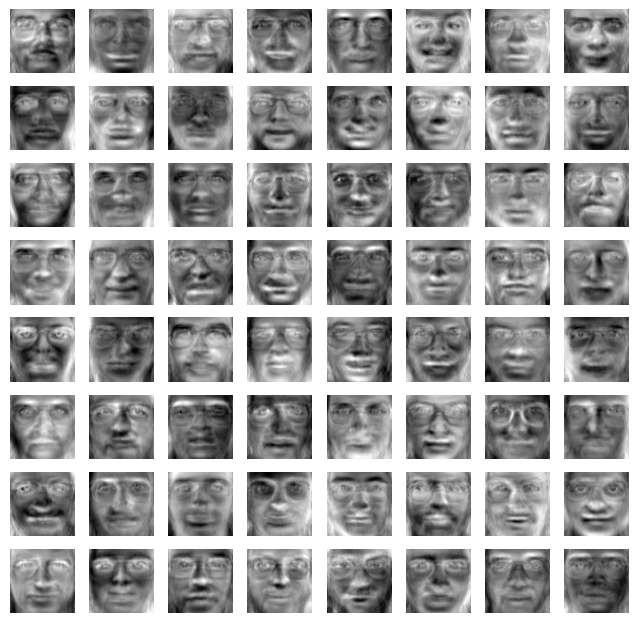

In [14]:
plt.figure(figsize=(8,8), dpi=dpi)
for i, p in enumerate(t[2:]):
    plt.subplot(8, 8, i+1)
    plt.axis('off')
    plt.imshow(p, cmap='gray')

Let's generate some 'fake' faces by sampling from Pr(h) and then computing E[Pr(x | h)]...

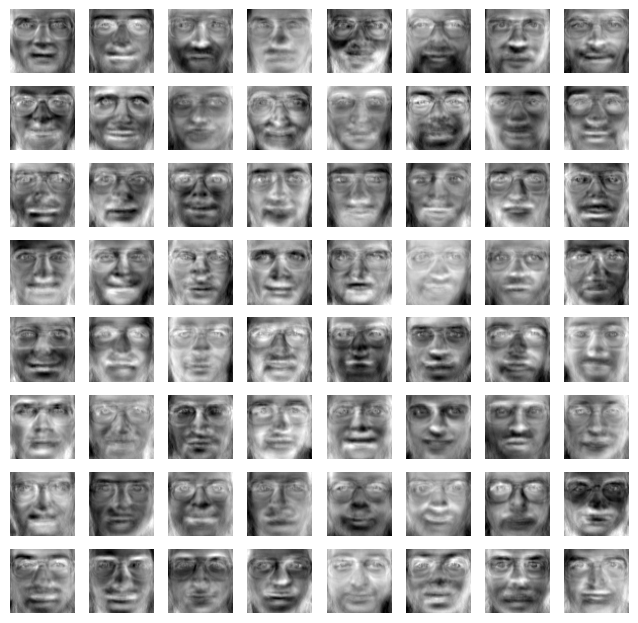

In [15]:
t = np.random.multivariate_normal(np.zeros([K]), np.identity(K), 64)
t = np.reshape(u[x,:,x] + mm(P[x], t[:,:,x]), [64,64,64])

plt.figure(figsize=(8,8), dpi=dpi)
for i, a in enumerate(t):
    plt.subplot(8, 8, i+1)
    plt.axis('off')
    plt.imshow(a, cmap='gray')

I wonder if something like this can be used to a good effect as a kind of starter for training a GAN (i.e., by using the factors as initial weights for the first layer of the generator segment) [[10](https://en.wikipedia.org/wiki/Generative_adversarial_network)].

Now let's compress the images and show the restored results...

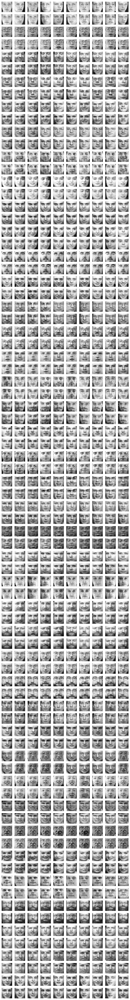

In [16]:
h = mm(inv(mm(P.T / Z, P)), (P.T / Z), (X[:,:,x] - u[x,:,x]))
restored = np.reshape(u[:,x] + mm(P[x], h), imgs.shape)

plt.figure(figsize=(10,80), dpi=dpi)
for i in range(40):
    for j in range(10):
        plt.subplot(80, 10, 20*i+j+1)
        plt.imshow(imgs[i*10+j], cmap='gray')
        plt.axis('off')
    for j in range(10):
        plt.subplot(80, 10, 20*i+j+11)
        plt.imshow(restored[i*10+j], cmap='gray')
        plt.axis('off')

Notice how mere 64 factors were enough to restore the 64x64 images to a recognizable result.

Now, let's combine all the models into one general-purpose data density estimator...

### MoRSM (Mixture of Robust Subspace Models)

The relevant excerpts from [[2](http://web4.cs.ucl.ac.uk/staff/s.prince/book/book.pdf)]:

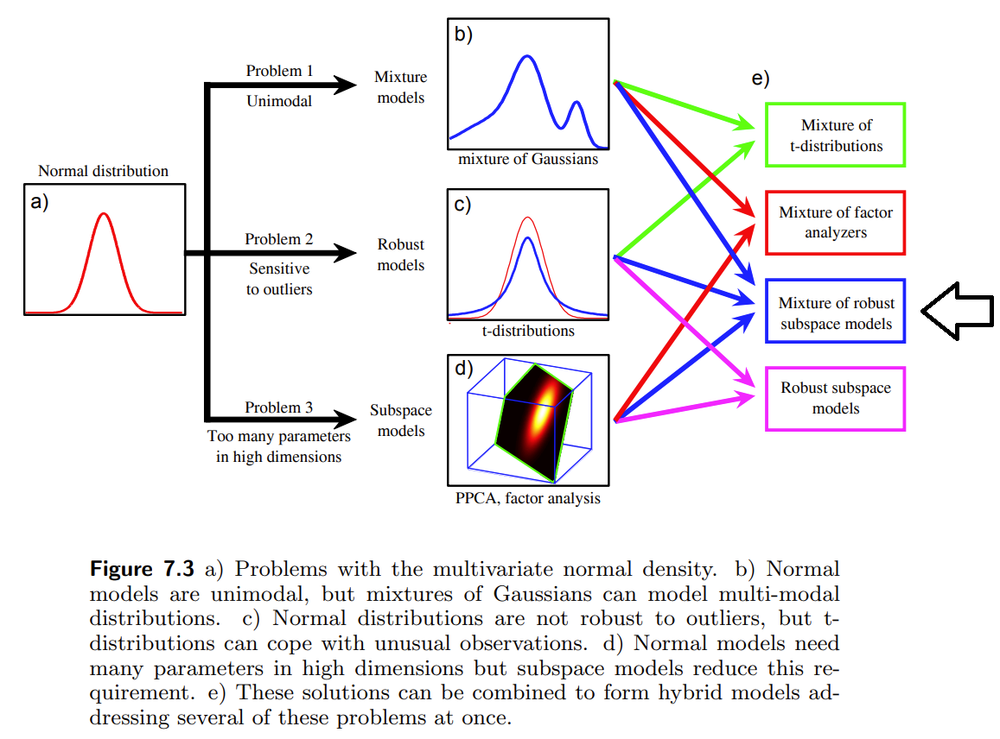

Note that one can conveniently play with the parameters of the MoRSM model (i.e., the number of mixture components, the degrees of freedom, and the number of factors) to get any combination of the other models.

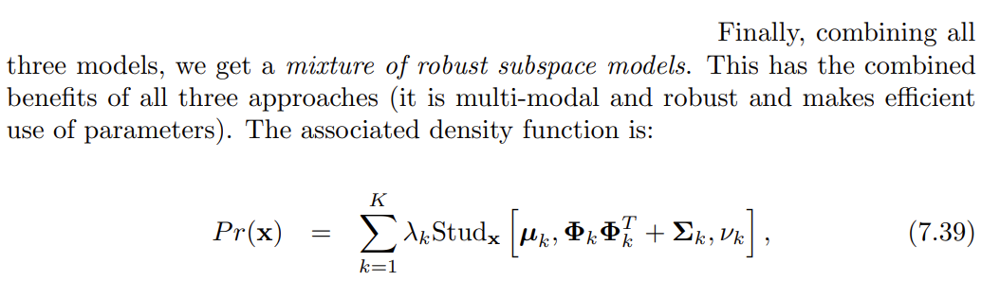

See my derivations for the EM steps [here](https://1drv.ms/u/s!AhCi8OxauMdBiHhPAV0tMHrF4IkZ?e=HEwizQ) (note that the page references are according to the hard copy of the book; the pages of the digital version are numbered differently).

The MoRSM model is a bit more complex than the others, so it's appropriate to define a class for it...

In [17]:
# see the above link for my derivations
class MoRSM():
    
    # u_init = initial means, K = the number of mixture components, d = the number of factors per component 
    # minVar is the minimum amount of variance in the diagonal covariance matrix - this is required to prevent numerical errors
    def __init__(self, X, u_init=[], K=1, d=1,
                 V=np.concatenate([np.linspace(1e-3,1.0,100, endpoint=False), np.linspace(1.0,1e+3,100)]), 
                 delta=1e+2, epochs=100, minVar=1e-2, disp=False):
        
        # init:
        n, D = X.shape
        u = self.u = u_init if len(u_init) else X[np.random.choice(n,K)]
        Z = self.Z = np.var(X, axis=0)[x] + minVar
        c = self.c = np.full(K, 1 / K)[x] 
        v = self.v = np.full(K, np.max(V))[x]
        P = self.P = np.random.normal(size=(K,D,d))
        V = V[x,x,:]
        L = [-np.inf]
        i = 0
        
        # EM loop: 
        while True:
            
            # objective:
            r, Cf, SMW = self.LL(X)
            mx = np.max(r, axis=1)[:,x]
            L.append(np.sum(mx + log(np.sum(np.exp(r - mx), axis=1)[:,x])))
            if i == epochs or L[-1] - L[-2] < delta:
                self.u, self.Z, self.c, self.v, self.P = u, Z, c, v, P
                if disp:
                    print('\nDone!')
                    plotObjective(L[1:])
                break
            i += 1
            if disp:
                print(f'In epoch {i}...', end='\r') 
            
            # E step:
            r = ((np.exp(r - mx)) / (np.sum(np.exp(r - mx), axis=1)[:,x]))[:,:,x,x]
            tf = mm(Cf[x], (P.transpose([0,2,1]) / Z[:,x])[x], (X[:,x] - u[x])[...,x])
            Eg = ((v + D) / (v + SMW))[:,:,x,x]
            Eglog = (digamma((v + D) / 2) - log((v + SMW) / 2))[:,:,x,x]
            rEg = r * Eg
            invSumEgEff = inv(np.sum(r * (Cf[x] + Eg * mm(tf, tf.transpose([0,1,3,2]))), axis=0))
            
            # M step:
            c = self.c = np.sum(r, axis=(0,2,3)) / np.sum(r)
            u = self.u = (np.sum(rEg * (X[:,x,:,x] - mm(
                np.sum(rEg * mm(X[:,x,:,x], tf.transpose([0,1,3,2])), axis=0), invSumEgEff, tf)), axis=0) /
                 np.sum(rEg * (1 - mm(np.sum(
                     rEg * tf.transpose([0,1,3,2]), axis=0), invSumEgEff, tf)), axis=0)).reshape([K,D])
            P = self.P = mm(np.sum(rEg * mm(X[:,x,:,x] - u[x,:,:,x], tf.transpose([0,1,3,2])), axis=0), invSumEgEff)
            Z = self.Z = (np.sum(r * (np.sum(mm(P[x], Cf[x]) * P[x], axis=-1, keepdims=True) + Eg * (
                X[:,x,:,x] - u[x,:,:,x] - mm(P[x], tf))**2), axis=(0,3)) / np.sum(r, axis=(0,3))) + minVar 
            if V.size > 1:
                v = self.v = V[0, 0, np.argmax(np.sum(
                    r.reshape(n,K,1) * (V / 2 * log(V / 2) - gammaln(V / 2) + (V / 2 - 1) * Eglog.reshape(n,K,1) - 
                                        V / 2 * Eg.reshape(n,K,1)) , axis=0), axis=1)]
                     
    
    # computes the Log Likelihood = log(Pr(X))
    def LL(self, X):
        u, Z, c, v, P = self.u, self.Z, self.c, self.v, self.P
        n, K, D, d = len(X), *P.shape
        Cf = inv(mm(P.transpose([0,2,1]) / Z[:,x], P) + np.identity(d))  
        logDet =  np.sum(log(Z), axis=-1) - np.linalg.slogdet(Cf)[1]  
        SMW = np.sum((X[:,x] - u[x])**2 / Z[x], axis=-1) - mm(
            (X[:,x] - u[x])[...,x].transpose([0,1,3,2]) / Z[x,:,x], P[x], Cf[x], 
            (P.transpose([0,2,1]) / Z[:,x])[x], (X[:,x] - u[x])[...,x]).reshape([n,K])
        r = log(c) + gammaln((v + D) / 2) - gammaln(v / 2) - (
            D * log(np.pi * v) + logDet + (v + D) * (log(v + SMW) - log(v))) / 2
        return r, Cf, SMW
 
    # returns the expected values of the hidden variables given the data
    def pred_H(self, X):
        r, Cf, SMW = self.LL(X)
        mx = np.max(r, axis=1)[:,x]
        m = np.argmax(((np.exp(r - mx)) / (np.sum(np.exp(r - mx), axis=1)[:,x])), axis=1)
        n, D = X.shape
        v = self.v
        g = ((v + D) / (v + SMW))[np.arange(n), m]
        u = self.u
        Z = self.Z
        P = self.P
        f = (np.sqrt(g)[:,x,x,x] * mm(
            Cf[x], (P.transpose([0,2,1]) / Z[:,x])[x], (X[:,x] - u[x])[...,x]))[np.arange(n), m, :, 0]
        return m, g, f
    
    # returns the expected data given the values of the hidden variables
    def pred_X(self, H):
        m, g, f = H
        u = self.u
        P = self.P
        X = u[m] + mm(P[m] / np.sqrt(g)[:,x,x], f[:,:,x])[:,:,0]
        return X

I should state that my implementation assumes that all factor matrices have the same number of factors - this doesn't necessarily inspire an optimal model, but it certainly maximizes parallelism. Additionally, the number of mixture components/clusters must be set manually. An adaptive solution can be derived from the algorithm described in [[13](https://arxiv.org/pdf/1507.02801.pdf)].

Notice that I used some necessary mathematical tricks to avoid potential numerical errors such as illegal division due to zero elements in the diagonal covariance matrix (increase the value of minVar if such issues persist), as well as the following equalities which are required to prevent overflow (see [[12](https://timvieira.github.io/blog/post/2014/02/11/exp-normalize-trick/)]):

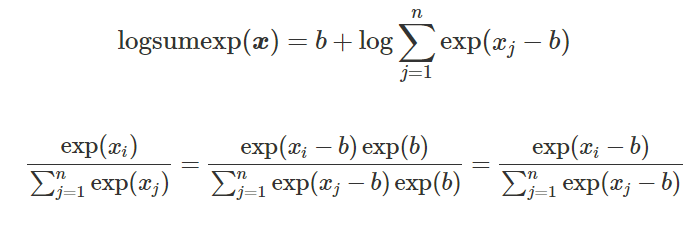

Let's fit a MoRSM to the the Olivetti faces dataset using the first image of every person as the initial means...

In epoch 21...
Done!


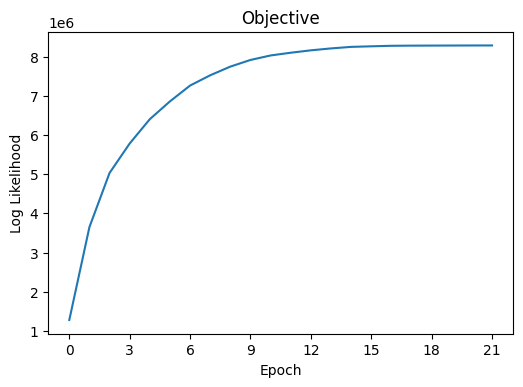

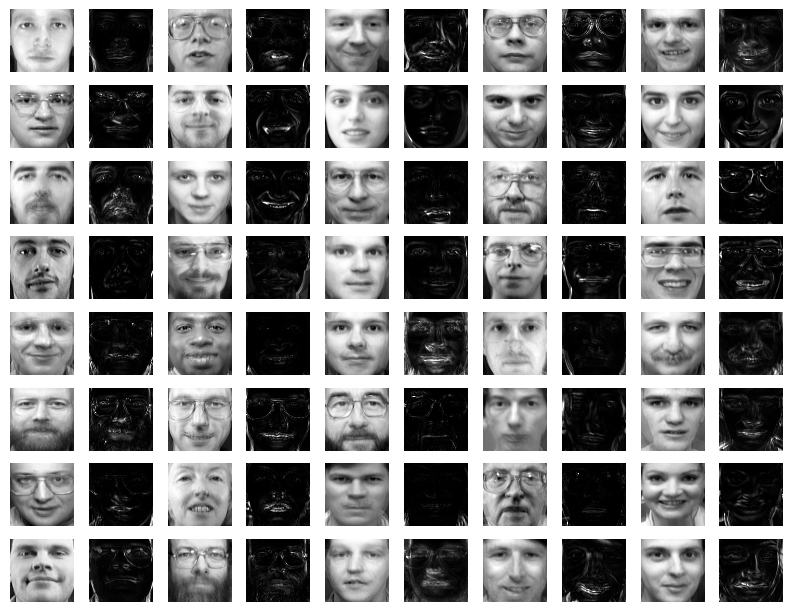

In [28]:
morsm = MoRSM(X, u_init=X[::10], K=40, d=5, delta=1e+3, disp=True)

u, Z = morsm.u.reshape([40,64,64]), morsm.Z.reshape([40,64,64])

plt.figure(figsize=(10,80), dpi=dpi)
for i in range(40):
        plt.subplot(80, 10, 2*i+1)
        plt.imshow(u[i], cmap='gray')
        plt.axis('off')
        plt.subplot(80, 10, 2*i+2)
        plt.imshow(Z[i], cmap='gray')
        plt.axis('off')

Notice how only 5 factors per mixture component were used to capture most of the variance in each cluster as it's usually associated with the images of a specific person. Also notice that the images I selected as initial means do not change much due to the robustness of the t-distribution. Results would not be as good with random mean initialization though.

Visualize the factors...

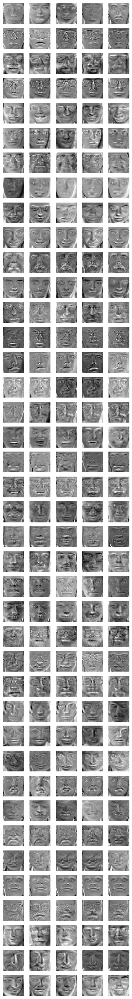

In [29]:
d = morsm.P.shape[-1]
plt.figure(figsize=(d,80), dpi=dpi)
for i in range(40):
    for j in range(d):
        plt.subplot(80, d, d*i+j+1)
        plt.imshow(morsm.P[i,:,j].reshape([64,64]), cmap='gray')
        plt.axis('off')

As expected, the factors seem to have captured various changes in lighting and pose/facial expressions.

Now, let's compress the images and show the restored results...

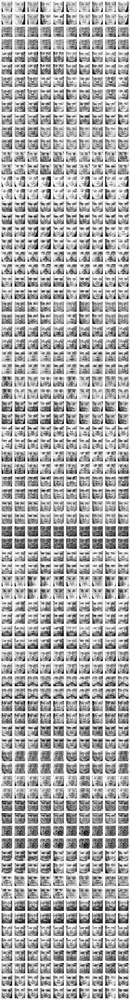

In [30]:
restored = morsm.pred_X(morsm.pred_H(X)).reshape(400,64,64)

plt.figure(figsize=(10,80), dpi=dpi)
for i in range(40):
    for j in range(10):
        plt.subplot(80, 10, 20*i+j+1)
        plt.imshow(imgs[i*10+j], cmap='gray')
        plt.axis('off')
    for j in range(10):
        plt.subplot(80, 10, 20*i+j+11)
        plt.imshow(restored[i*10+j], cmap='gray')
        plt.axis('off')

We can see that most images were restored almost perfectly even though I used only 5 factors per component - this means that every image can now be represented by only 6 values (5 factor coefficients and a mixture component number). However, the model failed to accurately restore quite a few images as well unfortunately.

In [21]:
# determines the true labels by using the predicted labels as a mask and selecting the mode
def test(true, pred, n_clusters):
    labels = np.zeros_like(pred)
    for i in range(n_clusters):
        mask = pred == i
        labels[mask] = mode(true[mask])[0]   
    return accuracy_score(true, labels), labels

# displays a confusion table
def conf(true, pred):
    mat = confusion_matrix(true, pred)
    plt.figure(figsize=(10,10), dpi=dpi)
    sns.heatmap(mat.T, square=True, annot=True, cbar=False)
    plt.xlabel('true label')
    plt.ylabel('predicted label')
    plt.show()

The MoRSM model lends itself towards being used as a robust semi-supervised clustering algorithm for high dimensional data, and so I will try to pit it against the popular k-means clustering algorithm [[11](https://en.wikipedia.org/wiki/K-means_clustering)]. To do this, I will first transform the Olivetti dataset into a more useful and lighter representation called HOG (Histogram of Oriented Gradients) [[8](https://en.wikipedia.org/wiki/Histogram_of_oriented_gradients)]. The methods defined in the above code segment will be used to illustrate the quality of the clustering results.

In [22]:
def hog(img):
    b = 8
    c = 16
    gx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=1)
    gy = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=1)
    mag, ang = cv2.cartToPolar(gx, gy)
    bins = np.int32(b * ang / (2 * np.pi))
    hist = []
    for i in range(64//c):
        for j in range(64//c):
            bin_cells = bins[c*i:c*(i+1),c*j:c*(j+1)]
            mag_cells = mag[c*i:c*(i+1),c*j:c*(j+1)]
            hist += [np.bincount(bin_cells.ravel(), mag_cells.ravel(), b)]    
    return np.hstack(hist)

The above method will receive a 64x64 image, divide it into 4x4 cells of 16x16 pixels, and transform each cell into a histogram of 8 values by binning the gradients' magnitudes according to their angles. Finally, the resulting 16 histograms will be concatenated into one small vector of 128 values which will constitute the new representation.

To further improve clustering quality, I transform the images into HOG representation, standardize the resulting features, and L2 normalize the resulting examples...

In [23]:
def trans(imgs):
    X_hog = np.array([hog(img) for img in imgs])
    X_std = (X_hog - np.mean(X_hog, axis=0)[x]) / np.std(X_hog, axis=0)[x]
    X_nrm = X_std / np.sum(X_std**2, axis=1)[:,x]**0.5
    return X_nrm
    
X_nrm = trans(imgs)

Now, let's run k-means using the first (transformed) image of each person as the initial means...

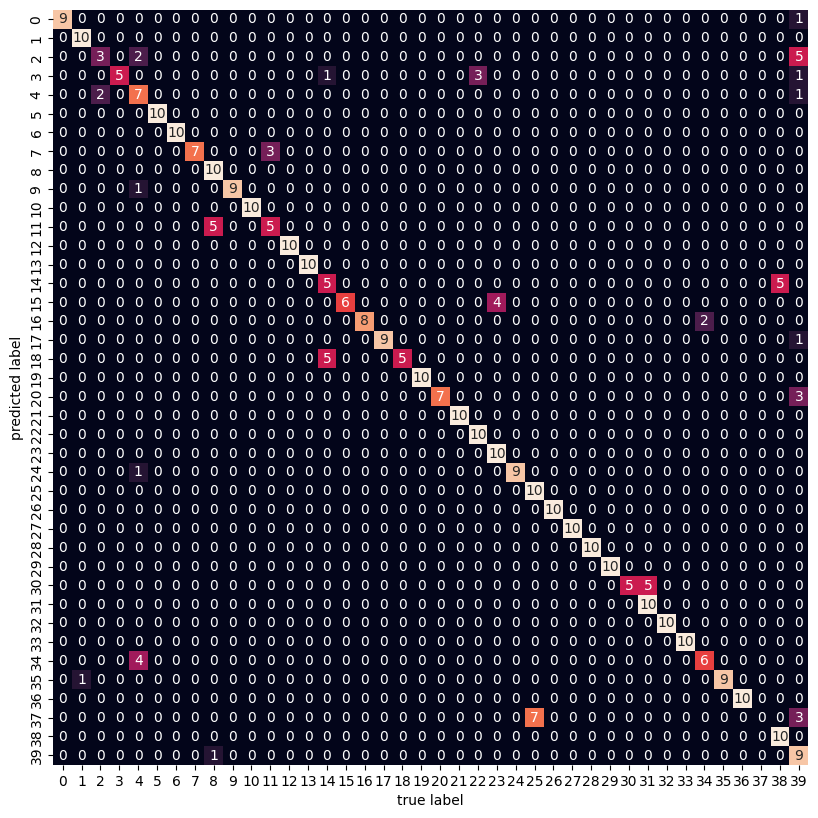

Accuracy: 0.8325


In [24]:
tgts = faces.target
kmeans = KMeans(n_init=1, init=X_nrm[::10], n_clusters=40).fit(X_nrm)
kmeansAccOrg, labels = test(tgts, kmeans.labels_, 40)
conf(labels, tgts)
print(f'Accuracy: {kmeansAccOrg}')

Repeat the process using the MoRSM model...

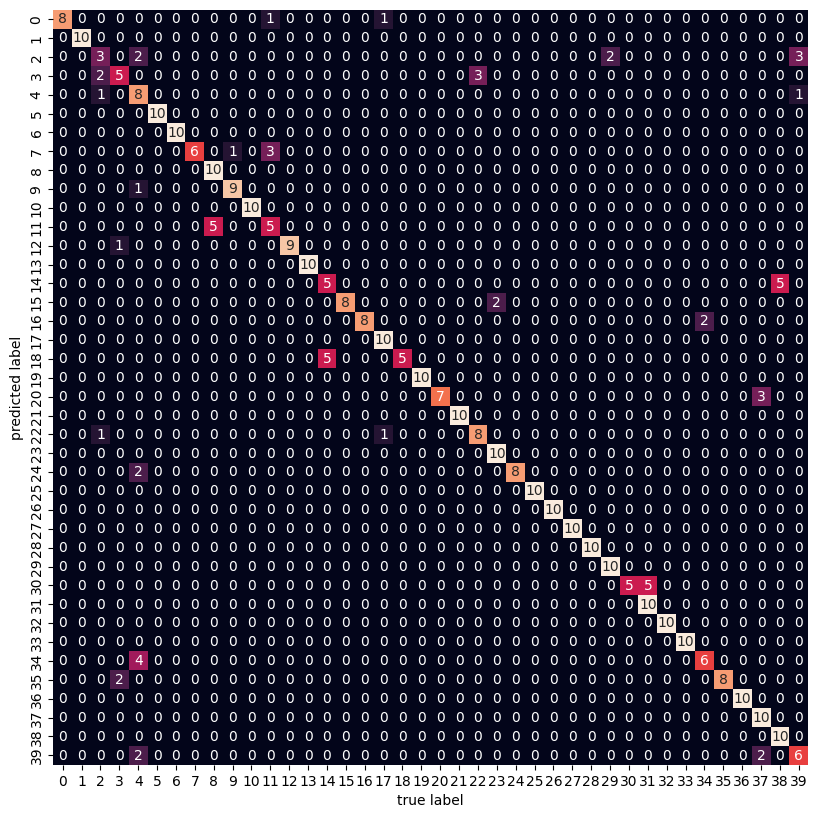

Accuracy: 0.8425


In [25]:
morsm = MoRSM(X_nrm, u_init=X_nrm[::10], V=np.linspace(eps,1e-16,100), K=40, d=1)
morsmAccOrg, labels = test(tgts, morsm.pred_H(X_nrm)[0], 40)
conf(labels, tgts)
print(f'Accuracy: {morsmAccOrg}')

We can see that both algorithms were able to cluster the data equally well. Keep in mind that the Olivetti dataset is very clean, and so MoRSM essentially functions here as a MoG that simply requires a lot less parameters thanks to its FA based components.

Let's see how the two algorithms fare when plenty of noise is added to the dataset...

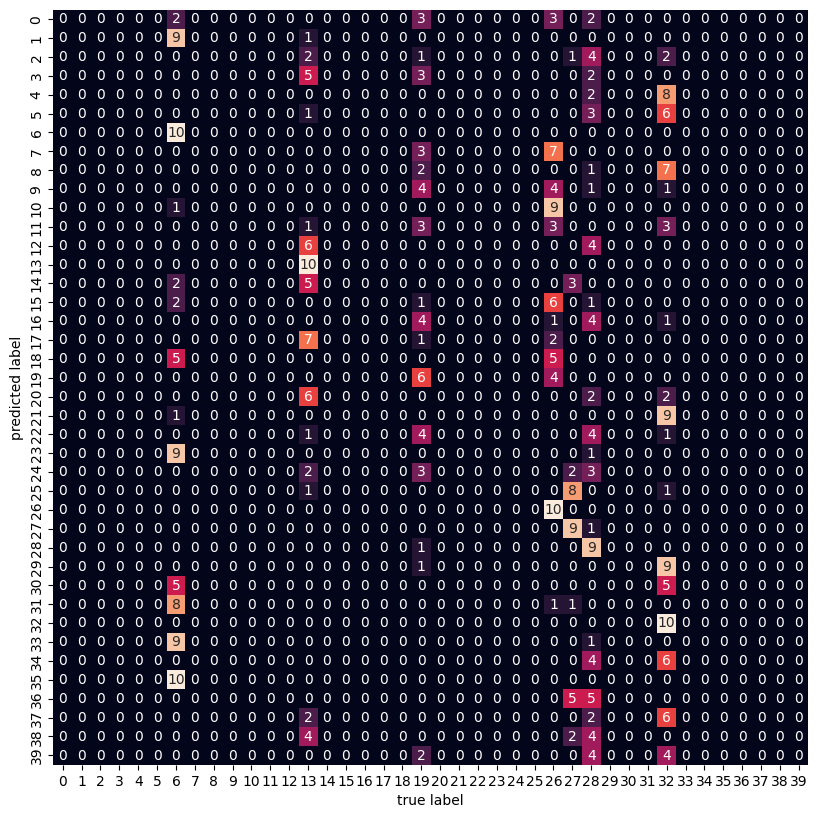

Accuracy: 0.16
Degradation: 0.808


In [42]:
nos = np.concatenate([imgs, np.random.normal(size=imgs.shape)], axis=0)
X_nos = trans(nos)
kmeans = KMeans(n_init=1, init=X_nos[:400:10], n_clusters=40).fit(X_nos)
kmeansAccNos, labels = test(tgts, kmeans.labels_[:400], 40)
conf(labels, tgts)
print(f'Accuracy: {kmeansAccNos}\nDegradation: {np.round(1 - kmeansAccNos / kmeansAccOrg, 3)}')

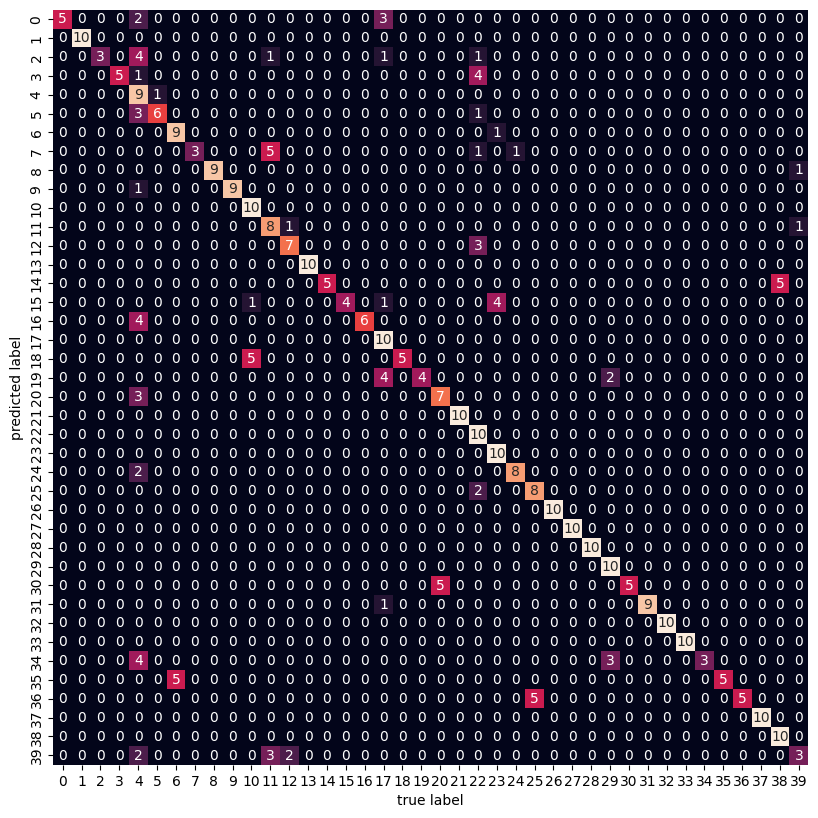

Accuracy: 0.75
Degradation: 0.11


In [46]:
morsm = MoRSM(X_nos, u_init=X_nos[:400:10], V=np.linspace(eps,1e-16,100), K=40, d=1)
morsmAccNos, labels = test(tgts, morsm.pred_H(X_nos)[0][:400], 40)
conf(labels, tgts)
print(f'Accuracy: {morsmAccNos}\nDegradation: {np.round(1 - morsmAccNos / morsmAccOrg, 3)}')

We can see that the added noise destroyed the ability of k-means to accurately cluster the transformed data (the accuracy degraded by around 80%), whereas MoRSM was only moderately affected (around 10% degradation). The MoRSM model is highly robust indeed thanks to its t-distribution based components.

### References 

[1] http://www.computervisionmodels.com/

[2] http://web4.cs.ucl.ac.uk/staff/s.prince/book/book.pdf

[3] http://www0.cs.ucl.ac.uk/external/s.prince/book/Algorithms.pdf

[4] https://en.wikipedia.org/wiki/Multivariate_t-distribution

[5] https://scikit-learn.org/0.19/datasets/olivetti_faces.html

[6] https://en.wikipedia.org/wiki/Woodbury_matrix_identity

[7] https://en.wikipedia.org/wiki/Matrix_determinant_lemma

[8] https://en.wikipedia.org/wiki/Histogram_of_oriented_gradients

[9] https://en.wikipedia.org/wiki/Hadamard_product_(matrices)

[10] https://en.wikipedia.org/wiki/Generative_adversarial_network

[11] https://en.wikipedia.org/wiki/K-means_clustering

[12] https://timvieira.github.io/blog/post/2014/02/11/exp-normalize-trick/

[13] https://arxiv.org/pdf/1507.02801.pdf